In [1]:
import numpy as np
import pandas as pd
import xgboost as xgb
from keras.models import Model, load_model
from keras.layers import MaxPooling2D, GlobalMaxPooling2D, GlobalAveragePooling2D, Flatten
from sklearn.model_selection import cross_validate, train_test_split, StratifiedKFold, KFold
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from skimage import transform
from sklearn import metrics, cluster
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
%matplotlib inline
RANDOM_SEED = 43
np.random.seed(RANDOM_SEED)

/home/can/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
Using TensorFlow backend.


# Load Training Data

In [2]:
# Load the training data
# Train
df_train = pd.read_json('./data/train.json')

df = df_train  # .. 
print len(df)

def normalize(im):
    im = im - np.mean(im)
    im = im / np.std(im)
    return im

X, y = [], []
for im_band1, im_band2, label in zip(df['band_1'], df['band_2'], df['is_iceberg']):
    im_band1 = np.array(im_band1).reshape(75, 75, 1)
    im_band2 = np.array(im_band2).reshape(75, 75, 1)    
    # Preprocess
    # - Zero mean
    im_band1 -= np.mean(im_band1)
    im_band2 -= np.mean(im_band2)
    # - Normalize
    im_band1 /= np.std(im_band1)
    im_band2 /= np.std(im_band2)    
    im = np.concatenate([im_band1, im_band2], axis=2)
#     im = np.concatenate([normalize(im_band1), normalize(im_band2), get_convolve(im_band1, im_band2)], axis=2)
    X.append(im)
    y.append(label)    
X = np.array(X)
y = np.array(y)
print 'X.shape:', X.shape
print 'y.shape:', y.shape

1604
X.shape: (1604, 75, 75, 2)
y.shape: (1604,)


# Extract Features

In [3]:
N_SPLITS = 5
MODEL_NUMBER = 1
MODEL_PATH = './models/model12-v3/model' + str(MODEL_NUMBER)  + '.h5'

In [4]:
# Load the model
base_model = load_model(MODEL_PATH)
base_model.layers

# Create the model
x = base_model.layers[-7].output
x = GlobalAveragePooling2D()(x)
# x = Flatten()(x)
model = Model(input=base_model.input, output=x)
model

/home/can/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("gl..., inputs=Tensor("co...)`
  if __name__ == '__main__':


In [5]:
# Extract the features
# Train
X = list(X)
for i, im in tqdm_notebook(enumerate(X)):
    im = np.expand_dims(im, axis=0)
    X[i] = np.squeeze(model.predict(im))
X = np.array(X)
print 'X.shape:', X.shape

HBox(children=(IntProgress(value=1, bar_style=u'info', max=1), HTML(value=u'')))


X.shape: (1604, 256)


# PCA

In [6]:
pca_model = PCA(n_components=2, random_state=RANDOM_SEED)
pca_model.fit(X)
X_r = pca_model.transform(X)

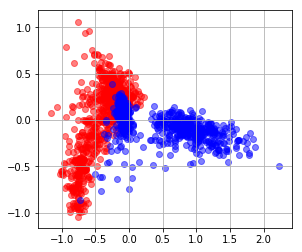

In [7]:
labels = [0, 1]
colors = ['r', 'b']
y_ = (y > 0.5).astype(np.int)

# Plot
fig = plt.figure(figsize=(10, 4))
# * Train
plt.subplot(1,2,1)
for label, color in zip(labels, colors):
    X_r_ = X_r[y_ == label]
    plt.scatter(X_r_[:, 0], X_r_[:, 1], c=color, alpha=0.5)
plt.grid('on')

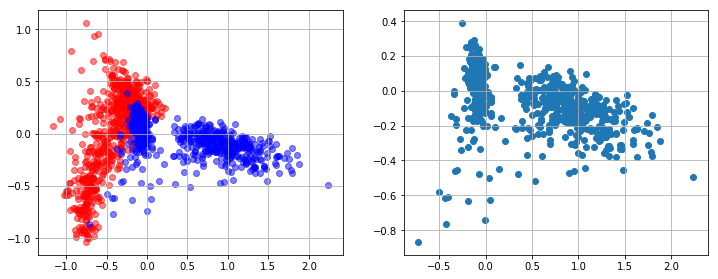

In [8]:
#
fig = plt.figure(figsize=(12, 4.5))

# Plot 1
plt.subplot(1,2,1)
labels = [0, 1]
colors = ['r', 'b']
for label, color in zip(labels, colors):
    X_ = X_r[y == label]
    plt.scatter(X_[:, 0], X_[:, 1], c=color, alpha=0.5)
plt.grid('on')

# Plot 2
plt.subplot(1,2,2)
X_ = X_r[y == 1]
plt.scatter(X_[:, 0], X_[:, 1])
plt.grid('on')

In [9]:
# Get iceberg indices
iceberg_indices = np.where(y == 1)[0]
iceberg_indices

array([   2,    5,    6,   10,   12,   13,   19,   21,   23,   25,   26,
         28,   32,   33,   34,   35,   36,   38,   39,   40,   46,   47,
         49,   50,   51,   53,   54,   58,   60,   61,   66,   68,   69,
         70,   73,   74,   75,   77,   78,   81,   82,   83,   84,   85,
         86,   88,   90,   91,   96,   97,   98,   99,  102,  104,  106,
        108,  109,  111,  118,  119,  121,  122,  123,  124,  125,  128,
        130,  131,  132,  133,  134,  135,  138,  140,  141,  144,  146,
        147,  148,  150,  151,  154,  158,  160,  163,  165,  167,  169,
        170,  172,  173,  175,  177,  178,  183,  192,  193,  195,  201,
        202,  206,  207,  209,  210,  211,  213,  216,  223,  224,  225,
        228,  229,  230,  231,  234,  236,  237,  238,  239,  241,  242,
        244,  245,  246,  248,  251,  252,  253,  255,  257,  258,  259,
        262,  266,  267,  268,  269,  271,  274,  275,  276,  279,  281,
        282,  285,  291,  292,  293,  298,  299,  3

In [10]:
# K-Means Clustering for iceberg
X_r_iceberg = X_r[iceberg_indices]
kmeans_model = cluster.KMeans(n_clusters=2, random_state=RANDOM_SEED)
kmeans_model.fit(X_r_iceberg)
kmeans_indices = kmeans_model.predict(X_r_iceberg)
kmeans_distances = kmeans_model.transform(X_r_iceberg)

In [14]:
kmeans_model.cluster_centers_

array([[ 0.98434746, -0.12820978],
       [-0.06081766,  0.0128576 ]], dtype=float32)

In [93]:
t_dist = 999
small_group_i = iceberg_indices[(kmeans_indices == 1) & (kmeans_distances[:, 1] < t_dist)]
print len(small_group_i)
small_group_i

420


array([   2,   10,   12,   13,   19,   21,   26,   28,   32,   33,   34,
         35,   50,   51,   53,   54,   58,   60,   61,   66,   73,   74,
         81,   82,   85,   88,   90,   97,   98,  108,  111,  118,  121,
        122,  123,  125,  128,  130,  132,  133,  138,  140,  150,  160,
        165,  167,  169,  170,  172,  173,  178,  209,  210,  213,  223,
        225,  228,  229,  230,  236,  237,  242,  244,  246,  248,  251,
        253,  257,  259,  266,  267,  268,  271,  274,  276,  279,  281,
        285,  292,  298,  299,  300,  305,  306,  307,  308,  313,  315,
        318,  320,  323,  325,  326,  330,  331,  347,  348,  353,  358,
        360,  361,  365,  366,  370,  371,  373,  380,  394,  395,  408,
        410,  422,  425,  426,  428,  430,  434,  437,  443,  444,  450,
        451,  453,  455,  457,  462,  467,  470,  472,  473,  478,  480,
        487,  488,  489,  492,  497,  502,  504,  506,  507,  513,  514,
        518,  520,  521,  522,  525,  529,  530,  5

In [94]:
df.loc[small_group_i]

,band_1,band_2,id,inc_angle,is_iceberg
2,"[-24.603676, -24.603714, -24.871029, -23.15277...","[-24.870956, -24.092632, -20.653963, -19.41104...",58b2aaa0,45.2859,1
10,"[-21.397552, -19.753859, -23.426783, -24.65221...","[-26.72291, -27.418192, -27.787899, -25.774536...",3aac67cd,44.624,1
12,"[-21.112206, -21.638832, -25.436468, -23.22255...","[-27.30481, -28.415203, -24.634125, -26.015789...",3c794f0c,41.8544,1
13,"[-23.864258, -27.755791, -26.047226, -24.62014...","[-23.626272, -24.620068, -28.546, -26.363146, ...",86730f0d,45.2909,1
19,"[-21.557806, -22.084446, -19.187838, -16.91901...","[-22.084385, -24.583221, -30.13426, -26.461437...",6d81d201,37.2802,1
21,"[-26.345797, -26.05139, -26.650715, -26.650715...","[-30.488308, -26.05139, -22.924503, -22.924503...",112a6cfa,38.0669,1
26,"[-10.99748, -11.994458, -11.209444, -11.209444...","[-12.792967, -18.622711, -13.816119, -13.81611...",958d42a8,40.3904,1
28,"[-27.995171, -23.865738, -22.165567, -22.76487...","[-28.785341, -30.620794, -27.625595, -25.40263...",faf2c49e,42.5891,1
32,"[-34.254326, -29.97677, -28.233807, -27.123505...","[-27.123379, -29.507149, -31.560438, -29.97685...",83dd3a43,43.9466,1
33,"[-24.426573, -22.591206, -23.46056, -24.685993...","[-29.950699, -29.035591, -29.481161, -27.09747...",f193e8b0,44.6239,1


In [96]:
np.save('./smallgroup.npy', small_group_i)

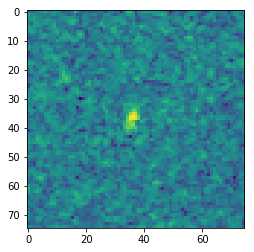

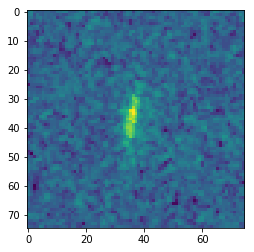

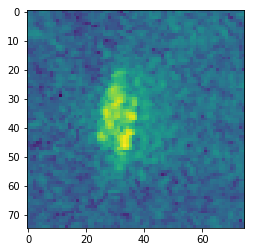

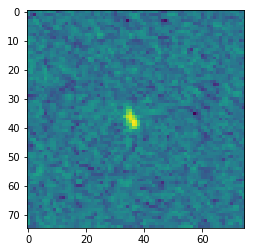

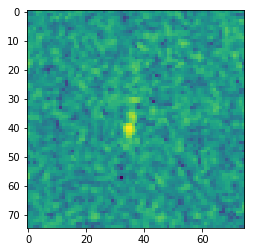

...

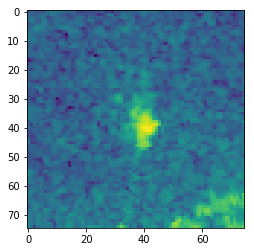

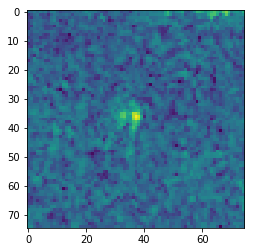

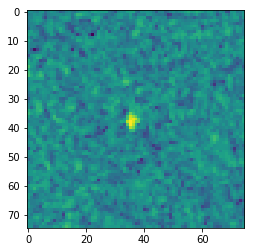

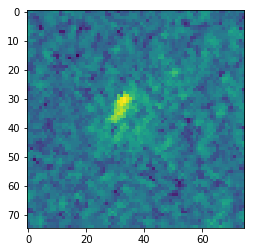

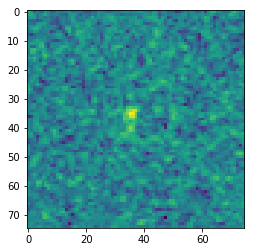

In [95]:
df_ = df.loc[small_group_i]
# df_ = df.loc[cluster1_i]
for row in df_.iterrows():
    im = np.array(row[1]['band_1']).reshape(75, 75)
    label = row[1]['is_iceberg']
    # Plot
    fig = plt.figure()
    plt.imshow(im)

In [92]:
# N = 16
# cluster_centers = kmeans_model.cluster_centers_
# # Cluster 0
# n_cluster = 0
# print cluster_centers[n_cluster]
# distances = [np.sqrt(np.sum((x - cluster_centers[n_cluster]) ** 2)) for x in list(X_r)]
# distances = zip(range(len(X_r)), distances) 
# distances = sorted(distances, key=lambda x: x[1])
# cluster0_i = [e[0] for e in distances][:N]
# print 'cluster0_i:', cluster0_i

# # Cluster 1
# n_cluster = 1
# print cluster_centers[n_cluster]
# distances = [np.sqrt(np.sum((x - cluster_centers[n_cluster]) ** 2)) for x in list(X_r)]
# distances = zip(range(len(X_r)), distances) 
# distances = sorted(distances, key=lambda x: x[1])
# cluster1_i = [e[0] for e in distances][:N]
# print 'cluster1_i:', cluster1_i

In [83]:
# # Plot cluster 1
# fig = plt.figure(figsize=(12, 12))
# for i, c_i in enumerate(cluster1_i):
#     plt.subplot(4, 4, i + 1)
#     plt.imshow(X[c_i, ..., 0])
#     plt.title(y[c_i])

In [97]:
i = np.load('./smallgroup.npy')